# Load data

In [2]:
import xarray as xr

data_dir = 'D:/VScode/Last_deglaciation/data'
ds_sat_EOFs = xr.open_dataset(data_dir + '/ds_sat_EOFs.nc')
# ds_sat_EOFs.info

sat_centered_weighted = ds_sat_EOFs['sat_centered_weighted'].values
sat_centered_weighted = sat_centered_weighted.reshape(len(ds_sat_EOFs['age']), 96*144)
print('shape of the reshaped sat_centered_weighted:', sat_centered_weighted.shape)

shape of the reshaped sat_centered_weighted: (65, 13824)


In [3]:
path='D:/VScode/Last_deglaciation/data/LGMR_SIC_May2023.nc'

# read the nc file from the path
import xarray as xr
ds_seaice = xr.open_dataset(path)
ds_seaice.info

c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\xarray\coding\variables.py:148: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


<bound method Dataset.info of <xarray.Dataset>
Dimensions:  (lat: 96, lon: 144, age: 120, dims: 5)
Coordinates:
  * lat      (lat) float32 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * age      (age) float32 100.0 300.0 500.0 ... 2.35e+04 2.37e+04 2.39e+04
  * dims     (dims) object 'mean              ' ... '97.5percentile    '
Data variables:
    sic      (dims, age, lat, lon) float32 ...>

# Crop, center and weight the sea ice data

In [4]:
import numpy as np
# Remove data with age<11
ds_seaice = ds_seaice.where(ds_seaice.age >= 11000, drop=True)

# Center the data
# Extract 'sic' for dims=1
sic_data = ds_seaice['sic'].isel(dims=1)

# Calculate the mean along the 'age' axis
mean_sic_data = sic_data.mean(dim='age')

# Subtract the mean from the data
centered_sic_data = sic_data - mean_sic_data

ds_seaice['sic_centered'] = centered_sic_data

# Apply the cosine weight
# Assuming the lat coordinate of ds_seaice is identical to ds_sat 
weight_seaice = np.cos(np.deg2rad(ds_seaice['lat']))

# Set weight to 0 if it is smaller than 0
weight_seaice = xr.where(weight_seaice < 0, 0, weight_seaice)

ds_seaice['weight'] = weight_seaice

# Multiply 'sic_centered' with the weight
sic_anomalies_weighted = ds_seaice['sic_centered'] * weight_seaice

# Add 'sic_anomalies_weighted' as a new data variable in the dataset
ds_seaice['sic_centered_weighted'] = sic_anomalies_weighted

# Reshape the data
sic_centered_weighted = ds_seaice['sic_centered_weighted'].values
sic_centered_weighted = sic_centered_weighted.reshape(len(ds_seaice['age']), 96*144)

print('shape of the reshaped sic_centered_weighted:', sic_centered_weighted.shape)


shape of the reshaped sic_centered_weighted: (65, 13824)


c:\Users\zps19\.conda\envs\pz-env\lib\site-packages\xarray\coding\variables.py:148: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


# Plot the processed SIC data for a check

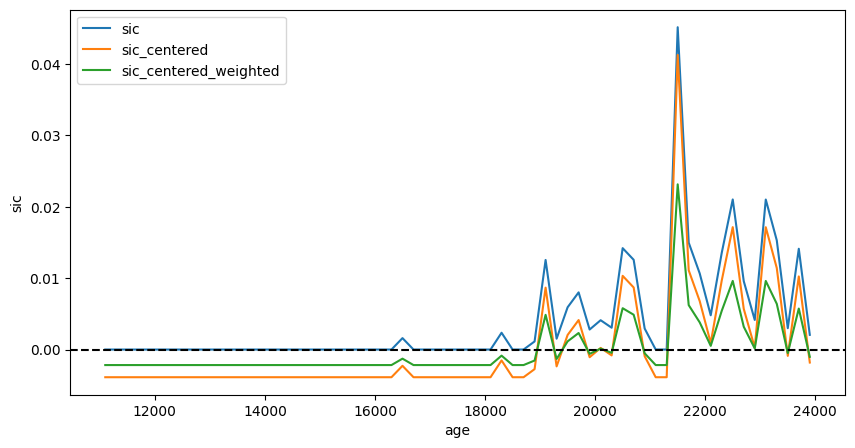

In [5]:
# Plot the sic, sic_centered, and sic_centered_weighted 

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(ds_seaice['age'], ds_seaice['sic'].isel(dims=1)[:, 77, 90], label='sic')
ax.plot(ds_seaice['age'], ds_seaice['sic_centered'][:, 77, 90], label='sic_centered')
ax.plot(ds_seaice['age'], ds_seaice['sic_centered_weighted'][:, 77, 90], label='sic_centered_weighted')

# plot a line at y=0
ax.axhline(y=0, color='black', linestyle='--')

ax.set_xlabel('age')
ax.set_ylabel('sic')
ax.legend()

plt.show()


# Save the data

In [ ]:
ds_seaice.to_netcdf('D:/VScode/Last_deglaciation/data/ds_seaice.nc')

# Doing MCA, only for the area of the Southern Ocean class

## The lat lon pairs are generated in notebook 'LGME_SEAICE_ana.ipynb'

In [6]:
# load the lat_lon_pairs
import numpy as np
path='D:/VScode/Last_deglaciation/data/lat_lon_pairs.npy'
lat_lon_pairs=np.load(path, allow_pickle=True)
lat_lon_pairs

array([[-78.63158 , 182.5     ],
       [-76.73684 , 165.      ],
       [-76.73684 , 167.5     ],
       ...,
       [ 72.947365, 117.5     ],
       [ 72.947365, 120.      ],
       [ 72.947365, 125.      ]], dtype=float32)

In [7]:
lat_lon_pairs.shape

(2451, 2)

# Check the lat-lon data

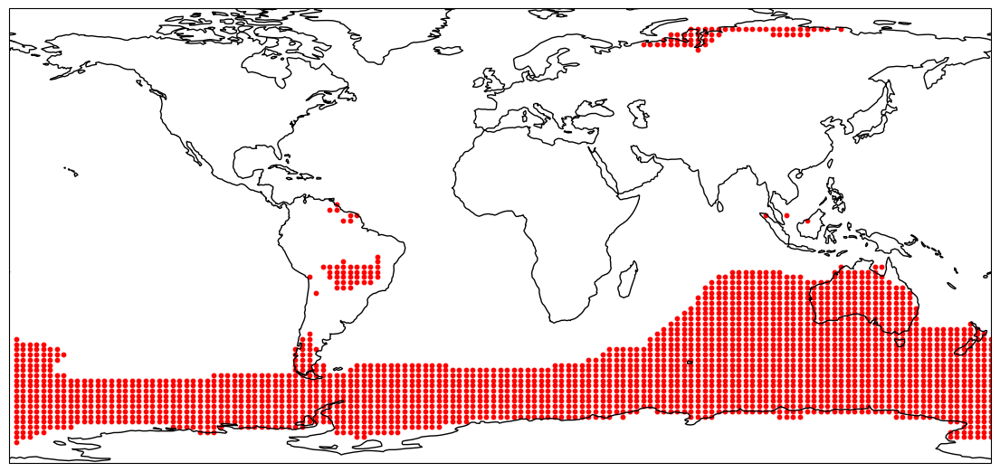

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature


# Separate latitudes and longitudes from the pairs
lats, lons = zip(*lat_lon_pairs)

# Create a figure and axis with a global map projection
fig, ax = plt.subplots(figsize=(14, 7), subplot_kw=dict(projection=ccrs.PlateCarree()))
ax.add_feature(cfeature.COASTLINE)

# Plot the lat-lon pairs as red dots
ax.scatter(lons, lats, color='red', s=10, transform=ccrs.PlateCarree())

# Display the plot
plt.show()


# Extract sat and sic data in this region

In [9]:
import numpy as np
import xarray as xr

def extract_data(ds, variable,lat_lon_pairs):
    # Initialize a list to store the sic data
    data_list = []
    
    # Loop through each lat-lon pair to extract the sic data
    for lat, lon in lat_lon_pairs:
        # Find the integer index corresponding to the lat and lon values
        lat_idx = np.argmin(np.abs(ds['lat'].values - lat))
        lon_idx = np.argmin(np.abs(ds['lon'].values - lon))
        
        # Extract sic data for dims=0 and age[:] for the current lat-lon pair
        # using integer-based indexing
        # if variable=='sic_centered_weighted':
        #     data = ds[variable].isel(dims=1,lat=lat_idx, lon=lon_idx).values
        # if variable=='sat_centered_weighted':
        data = ds[variable].isel(lat=lat_idx, lon=lon_idx).values
        
        # Append this data to our list
        data_list.append(data)
        
    # Convert list to a NumPy array for convenience
    data_array = np.array(data_list)
    
    return data_array


# Test the use of different dataset

In [10]:
sat_SO_data = extract_data(ds_sat_EOFs, 'sat_centered_weighted', lat_lon_pairs)
sic_SO_data = extract_data(ds_seaice, 'sic_centered_weighted', lat_lon_pairs)

In [22]:
sat_SO_data = extract_data(ds_sat_EOFs, 'sat', lat_lon_pairs)
sic_SO_data = extract_data(ds_seaice, 'sic', lat_lon_pairs)

In [28]:
sat_SO_data = extract_data(ds_sat_EOFs, 'sat_centered', lat_lon_pairs)
sic_SO_data = extract_data(ds_seaice, 'sic_centered', lat_lon_pairs)

# Save data

In [11]:
# save the sat_SO_data and sic_SO_data to local file
np.save('D:/VScode/Last_deglaciation/data/sat_SO_data.npy', sat_SO_data)
np.save('D:/VScode/Last_deglaciation/data/sic_SO_data.npy', sic_SO_data)


In [13]:
# load the sat_SO_data and sic_SO_data from local file
import numpy as np
sat_SO_data = np.load('D:/VScode/Last_deglaciation/data/sat_SO_data.npy', allow_pickle=True)
sic_SO_data = np.load('D:/VScode/Last_deglaciation/data/sic_SO_data.npy', allow_pickle=True)

In [14]:
sat_SO_data.shape

(2451, 65)

# Doing MCA

In [12]:
from xmca.array import MCA  # numpy

mca = MCA(sat_SO_data.T, sic_SO_data.T)
mca.solve()

svals_SO = mca.singular_values()
expvar_SO = mca.explained_variance()

eofs_SO  = mca.eofs()
pcs_SO   = mca.pcs()


In [68]:
expvar_SO

array([9.5645142e+01, 2.7700467e+00, 5.5285525e-01, 4.8420104e-01,
       2.1744163e-01, 1.4622790e-01, 6.0133655e-02, 5.0585385e-02,
       2.0964684e-02, 1.0295730e-02, 8.8463696e-03, 6.9199968e-03,
       4.3499153e-03, 3.6129358e-03, 2.8191623e-03, 2.2379868e-03,
       1.6005752e-03, 1.4834123e-03, 1.1588066e-03, 9.3209103e-04,
       8.7599631e-04, 7.9341396e-04, 7.3181884e-04, 7.1532029e-04,
       5.9717946e-04, 3.5966010e-04, 3.5463343e-04, 3.2914328e-04,
       3.0205978e-04, 2.5110866e-04, 2.3112552e-04, 2.2033414e-04,
       2.1070889e-04, 1.7647551e-04, 1.5318097e-04, 1.4859330e-04,
       1.4668901e-04, 1.2713089e-04, 1.2568026e-04, 1.1273646e-04,
       1.0738260e-04, 9.8963188e-05, 8.8568850e-05, 7.9027683e-05,
       7.7010583e-05, 7.1976567e-05, 6.6331922e-05, 5.8374055e-05,
       5.4084438e-05, 5.0139955e-05, 4.6182951e-05, 4.2830834e-05,
       4.2015148e-05, 3.6304093e-05, 3.4807221e-05, 3.3204713e-05,
       2.9931465e-05, 2.8090577e-05, 2.5808666e-05, 2.5630467e

# Check whether it is performed on the correct data

In [34]:
sat_SO_data.T

array([[ 1.6427071 ,  2.016027  ,  2.123371  , ...,  4.2238293 ,
         4.0538383 ,  3.9366145 ],
       [ 1.6114538 ,  2.016529  ,  2.1066628 , ...,  4.1139154 ,
         3.9402401 ,  3.825824  ],
       [ 1.4868693 ,  1.90282   ,  1.9896022 , ...,  3.8248289 ,
         3.6638258 ,  3.5616608 ],
       ...,
       [-0.8551896 , -1.0453823 , -1.1269411 , ..., -0.85604155,
        -0.72830284, -0.6577903 ],
       [-0.8167293 , -0.8840695 , -0.9495003 , ..., -0.7582728 ,
        -0.6289378 , -0.54781586],
       [-0.73231405, -0.6271569 , -0.6685824 , ..., -0.64717644,
        -0.5225017 , -0.4357563 ]], dtype=float32)

In [35]:
mca.fields()

{'left': array([[ 1.6427052 ,  2.016027  ,  2.1233704 , ...,  4.2238297 ,
          4.0538373 ,  3.9366167 ],
        [ 1.6114519 ,  2.016529  ,  2.1066623 , ...,  4.113916  ,
          3.9402392 ,  3.8258262 ],
        [ 1.4868674 ,  1.9028201 ,  1.9896017 , ...,  3.824829  ,
          3.6638248 ,  3.561663  ],
        ...,
        [-0.8551916 , -1.0453821 , -1.1269416 , ..., -0.8560413 ,
         -0.7283038 , -0.6577882 ],
        [-0.8167313 , -0.8840694 , -0.9495008 , ..., -0.7582726 ,
         -0.62893873, -0.5478138 ],
        [-0.732316  , -0.6271568 , -0.66858286, ..., -0.6471762 ,
         -0.52250266, -0.43575424]], dtype=float32),
 'right': array([[ 0.00789817,  0.06861458,  0.07641576, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.00775173,  0.07021221,  0.07711684, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.00704921,  0.0695614 ,  0.07645107, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [-0.00520724, 

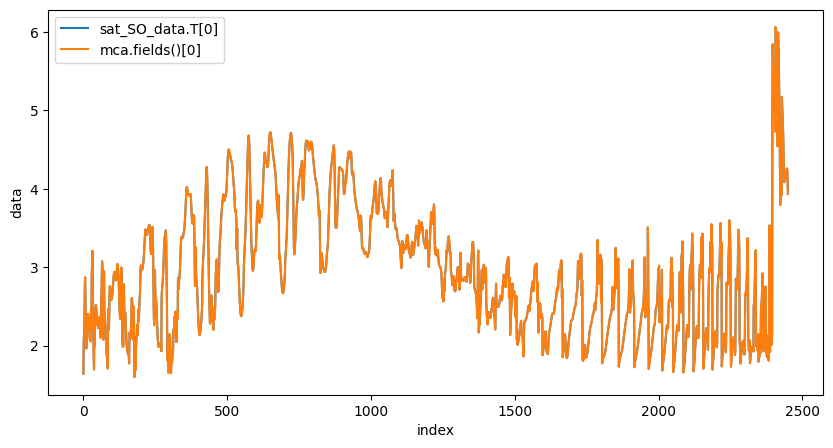

In [13]:
# plot the line plot to compare the first row of sat_SO_data.T and mac.fields()
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(sat_SO_data.T[0], label='sat_SO_data.T[0]')
ax.plot(mca.fields()['left'][0], label='mca.fields()[0]')

ax.set_xlabel('index')
ax.set_ylabel('data')
ax.legend()

# Plot PCs

In [14]:

PC_SO_sat1=pcs_SO['left'][:,0]
PC_SO_sat2=pcs_SO['left'][:,1]

PC_SO_sic1=pcs_SO['right'][:,0]
PC_SO_sic2=pcs_SO['right'][:,1]

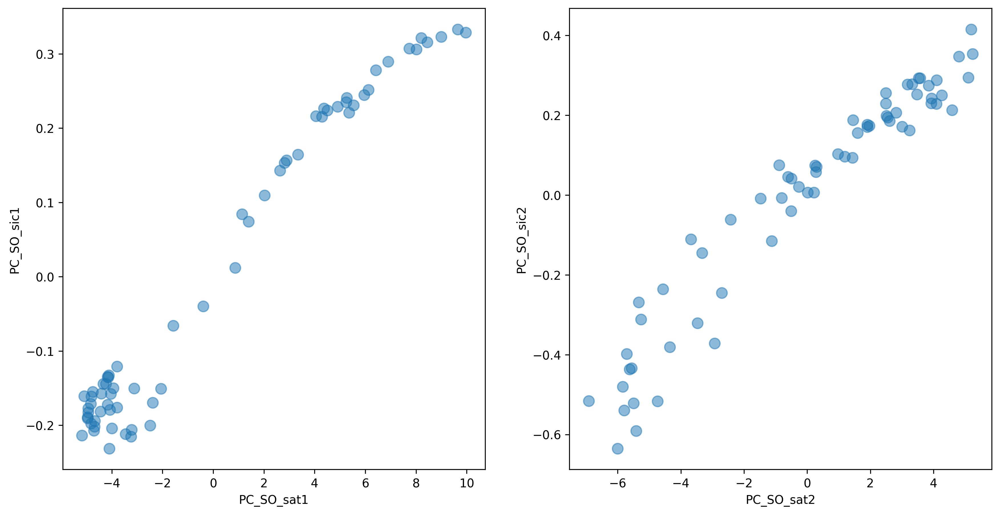

In [15]:
# plot scatter plot of PC_SO_sat1 vs PC_SO_sic1 and PC_SO_sat2 vs PC_SO_sic2 side by side
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=300)

axs[0].scatter(PC_SO_sat1, PC_SO_sic1, s=80, alpha=0.5)
axs[0].set_xlabel('PC_SO_sat1')
axs[0].set_ylabel('PC_SO_sic1')

axs[1].scatter(PC_SO_sat2, PC_SO_sic2, s=80, alpha=0.5)
axs[1].set_xlabel('PC_SO_sat2')
axs[1].set_ylabel('PC_SO_sic2')

plt.show()

#  Print the correlations between PCs

In [17]:
corr_matrix=mca.correlation_matrix()
corr_matrix

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

# Plot PCs

In [18]:
import matplotlib.pyplot as plt

def plot_PCs(age_left, pc1_left, pc2_left, age_right, pc1_right, pc2_right):
    fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=300)

    # Left Plot
    axs[0].plot(age_left, pc1_left, label='PC_SO_sat1')
    axs[0].plot(age_left, pc2_left, label='PC_SO_sat2')
    axs[0].set_xlabel('age')
    axs[0].set_ylabel('PC')
    axs[0].legend()

    # Right Plot
    axs[1].plot(age_right, pc1_right, label='PC_SO_sic1')
    axs[1].plot(age_right, pc2_right, label='PC_SO_sic2')
    axs[1].set_xlabel('age')
    axs[1].set_ylabel('PC')
    axs[1].legend()

    plt.show()



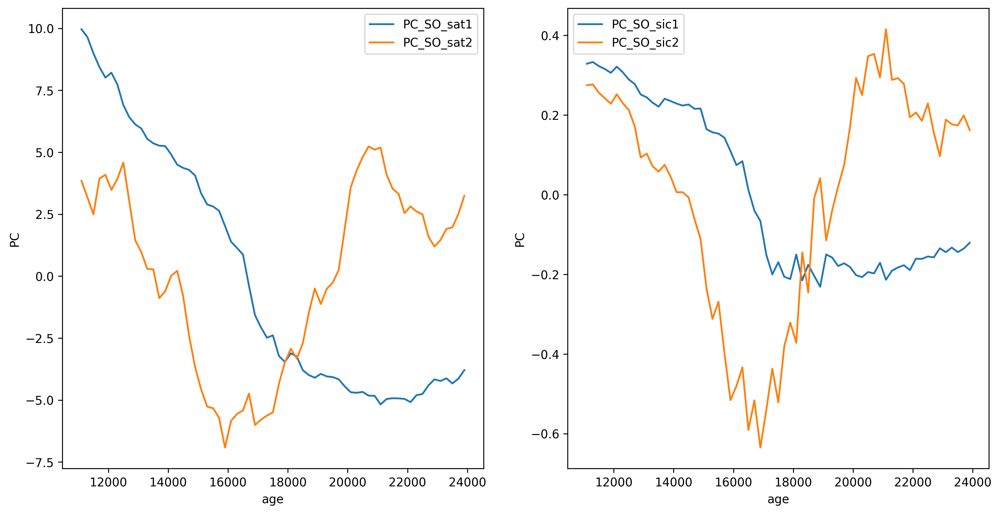

In [19]:
plot_PCs(ds_sat_EOFs['age'], PC_SO_sat1, PC_SO_sat2, ds_seaice['age'], PC_SO_sic1, PC_SO_sic2)

# Verify, see whether we can get PCs by eofs*data

In [20]:
eof_SO_sat1=eofs_SO['left'][:, 0]
eof_SO_sat2=eofs_SO['left'][:, 1]
eof_SO_sic1=eofs_SO['right'][:, 0]
eof_SO_sic2=eofs_SO['right'][:, 1]

In [43]:
eofs_SO['left'].shape

(2451, 65)

In [44]:
sat_SO_data.shape

(2451, 65)

In [21]:

PC_SO_sat1_test=eof_SO_sat1.T.dot(sat_SO_data)
PC_SO_sat2_test=eof_SO_sat2.T.dot(sat_SO_data)
PC_SO_sic1_test=eof_SO_sic1.T.dot(sic_SO_data)
PC_SO_sic2_test=eof_SO_sic2.T.dot(sic_SO_data)


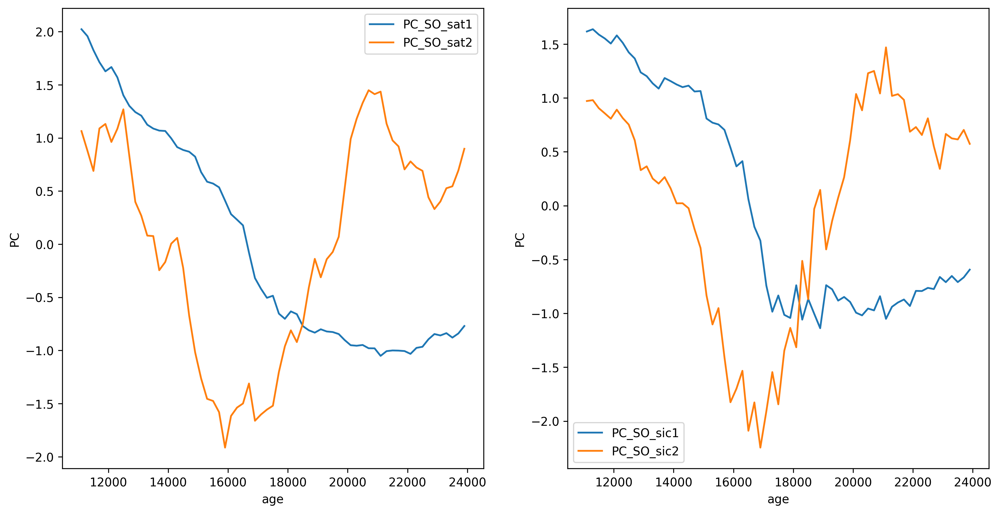

In [22]:

import matplotlib.pyplot as plt
from scipy.stats import zscore

fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=300)

axs[0].plot(ds_sat_EOFs['age'], zscore(PC_SO_sat1_test), label='PC_SO_sat1')
axs[0].plot(ds_sat_EOFs['age'], zscore(PC_SO_sat2_test), label='PC_SO_sat2')
axs[0].set_xlabel('age')
axs[0].set_ylabel('PC')
axs[0].legend()

axs[1].plot(ds_seaice['age'], zscore(PC_SO_sic1_test), label='PC_SO_sic1')
axs[1].plot(ds_seaice['age'], zscore(PC_SO_sic2_test), label='PC_SO_sic2')

axs[1].set_xlabel('age')
axs[1].set_ylabel('PC')
axs[1].legend()

# Plot EOFS

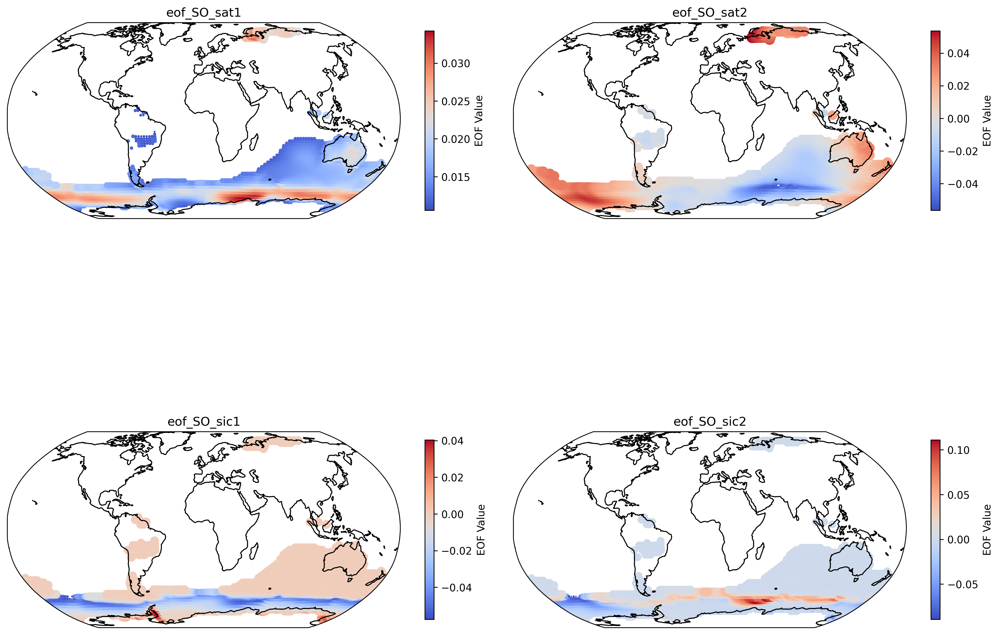

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Separate latitudes and longitudes from the pairs
lats, lons = zip(*lat_lon_pairs)

# List of EOFs to plot
eofs_list = [eof_SO_sat1, eof_SO_sat2, eof_SO_sic1, eof_SO_sic2]
titles = ['eof_SO_sat1', 'eof_SO_sat2', 'eof_SO_sic1', 'eof_SO_sic2']

# Create a figure and axes with a global map projection
fig, axs = plt.subplots(2, 2, figsize=(14, 14), dpi=300, subplot_kw=dict(projection=ccrs.Robinson()))

for i, ax in enumerate(axs.ravel()):
    eof = eofs_list[i]
    title = titles[i]

    # Normalizing the EOF values for size. This could be adapted per subplot if needed.
    eof_sizes = (eof - eof.min()) / (eof.max() - eof.min()) * 100

    ax.add_feature(cfeature.COASTLINE)
    scatter = ax.scatter(lons, lats, c=eof, s=eof_sizes, transform=ccrs.PlateCarree(), cmap='coolwarm')
    
    # Add a colorbar to each subplot
    cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', pad=0.05, shrink=0.3)
    cbar.ax.set_ylabel('EOF Value')
    
    ax.set_title(title)

# Adjust the layout
fig.tight_layout()
plt.show()


# We can see that the direction of PCs not match the real case in the data, this is due to the EOFs have two directions, here we correct it

In [25]:
corr_coef_sat1=1
corr_coef_sat2=-1
corr_coef_sic1=-1
corr_coef_sic2=1

eof_SO_sat1_corr=corr_coef_sat1*eof_SO_sat1
eof_SO_sat2_corr=corr_coef_sat2*eof_SO_sat2
eof_SO_sic1_corr=corr_coef_sic1*eof_SO_sic1
eof_SO_sic2_corr=corr_coef_sic2*eof_SO_sic2

PC_SO_sat1_test_corr=eof_SO_sat1_corr.T.dot(sat_SO_data)
PC_SO_sat2_test_corr=eof_SO_sat2_corr.T.dot(sat_SO_data)
PC_SO_sic1_test_corr=eof_SO_sic1_corr.T.dot(sic_SO_data)
PC_SO_sic2_test_corr=eof_SO_sic2_corr.T.dot(sic_SO_data)


# Plot the corrected PCs

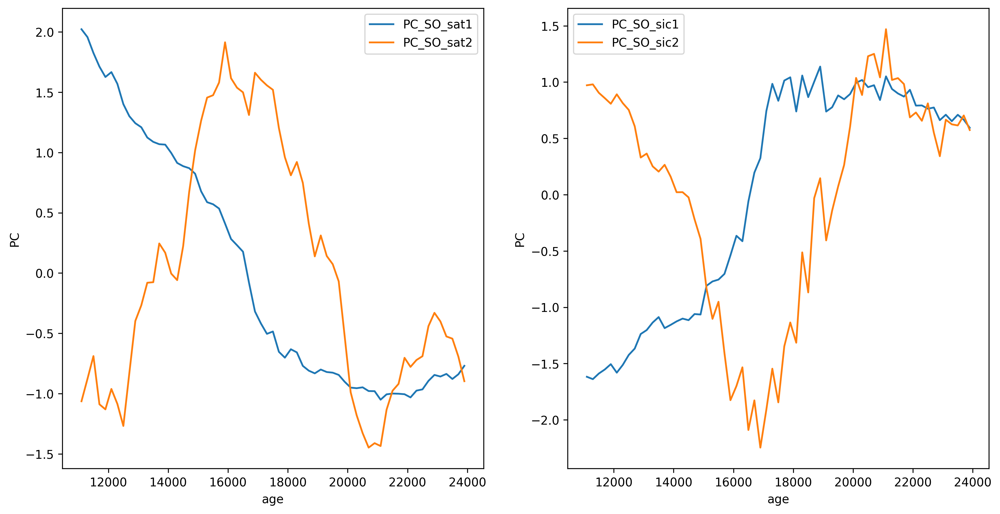

In [26]:

import matplotlib.pyplot as plt
from scipy.stats import zscore

fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=300)

axs[0].plot(ds_sat_EOFs['age'], zscore(PC_SO_sat1_test_corr), label='PC_SO_sat1')
axs[0].plot(ds_sat_EOFs['age'], zscore(PC_SO_sat2_test_corr), label='PC_SO_sat2')
axs[0].set_xlabel('age')
axs[0].set_ylabel('PC')
axs[0].legend()

axs[1].plot(ds_seaice['age'], zscore(PC_SO_sic1_test_corr), label='PC_SO_sic1')
axs[1].plot(ds_seaice['age'], zscore(PC_SO_sic2_test_corr), label='PC_SO_sic2')

axs[1].set_xlabel('age')
axs[1].set_ylabel('PC')
axs[1].legend()


# Compare the PC2 with the insolation

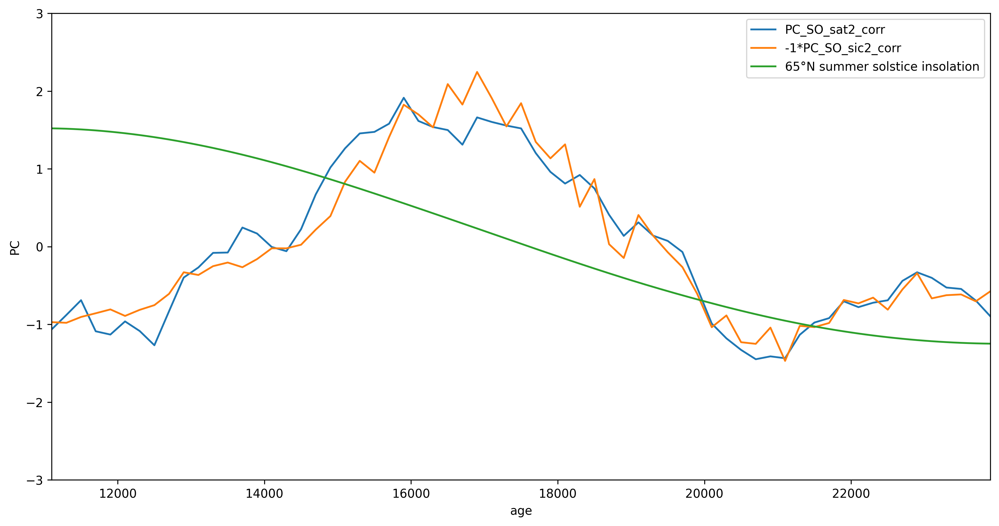

In [85]:
import matplotlib.pyplot as plt
from scipy.stats import zscore

# load PCs from local file
# PCs_Osman2021 = np.load('data/PCs_Osman2021.npy')
# age_Osman2021=np.load('data/age_Osman2021.npy')

# read the insolation data '65N_inso_mean90_-1Ma_0_inter100.txt'
import pandas as pd
path='D:/VScode/Last_deglaciation/data/65N_inso_mean90_-1Ma_0_inter100.txt'
insolation=pd.read_csv(path, sep='\s+', header=None)
# rename columns
insolation.columns=['age', 'insolation']
# age*-1000
insolation['age']=-1*insolation['age']*1000
# filp the dataframe
insolation=insolation.iloc[::-1]
insolation

fig, ax = plt.subplots(1, 1, figsize=(14, 7), dpi=300)
# set x and y axis limits
ax.set_xlim(ds_sat_EOFs['age'].values[0], ds_sat_EOFs['age'].values[-1])
ax.set_ylim(-3, 3)

ax.plot(ds_sat_EOFs['age'], zscore(PC_SO_sat2_test_corr), label='PC_SO_sat2_corr')
ax.plot(ds_seaice['age'], -1*zscore(PC_SO_sic2_test_corr), label='-1*PC_SO_sic2_corr')
ax.plot(insolation['age'], zscore(insolation['insolation']), label='65°N summer solstice insolation')
# ax.plot(age_Osman2021, zscore(PCs_Osman2021[:, 0]), label='PC2_Osman2021')

ax.set_xlabel('age')
ax.set_ylabel('PC')
ax.legend()



# Plot the corrected EOFs

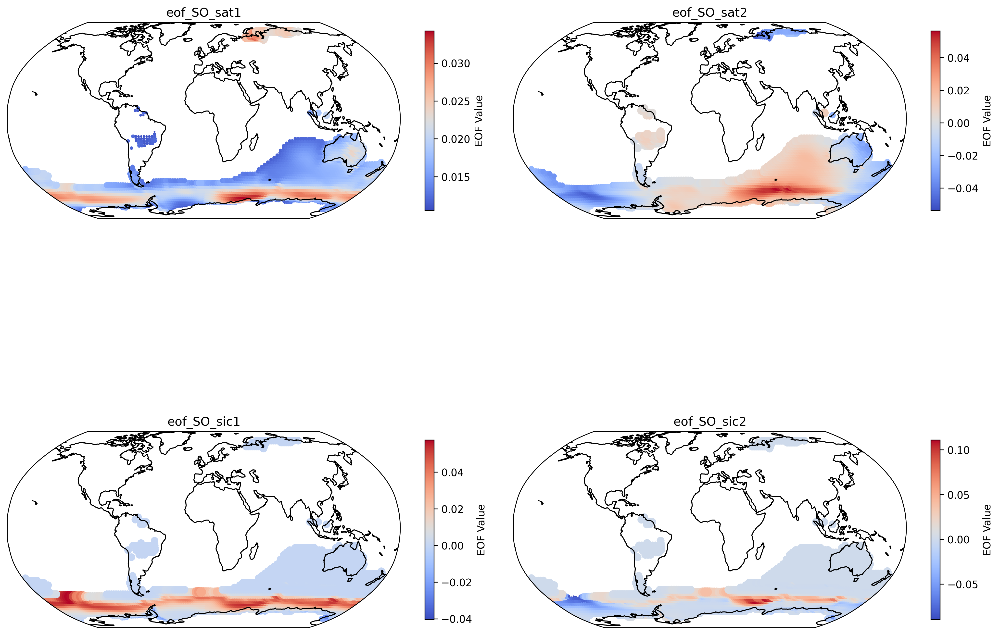

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Separate latitudes and longitudes from the pairs
lats, lons = zip(*lat_lon_pairs)

# List of EOFs to plot
eofs_list = [eof_SO_sat1_corr, eof_SO_sat2_corr, eof_SO_sic1_corr, eof_SO_sic2_corr]
titles = ['eof_SO_sat1', 'eof_SO_sat2', 'eof_SO_sic1', 'eof_SO_sic2']

# Create a figure and axes with a global map projection
fig, axs = plt.subplots(2, 2, figsize=(14, 14), dpi=300, subplot_kw=dict(projection=ccrs.Robinson()))

for i, ax in enumerate(axs.ravel()):
    eof = eofs_list[i]
    title = titles[i]

    # Normalizing the EOF values for size. This could be adapted per subplot if needed.
    eof_sizes = (eof - eof.min()) / (eof.max() - eof.min()) * 100

    ax.add_feature(cfeature.COASTLINE)
    scatter = ax.scatter(lons, lats, c=eof, s=eof_sizes, transform=ccrs.PlateCarree(), cmap='coolwarm')
    
    # Add a colorbar to each subplot
    cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', pad=0.05, shrink=0.3)
    cbar.ax.set_ylabel('EOF Value')
    
    ax.set_title(title)

# Adjust the layout
fig.tight_layout()
plt.show()


# Doing GMM on the four EOFs

# pLot EOFS

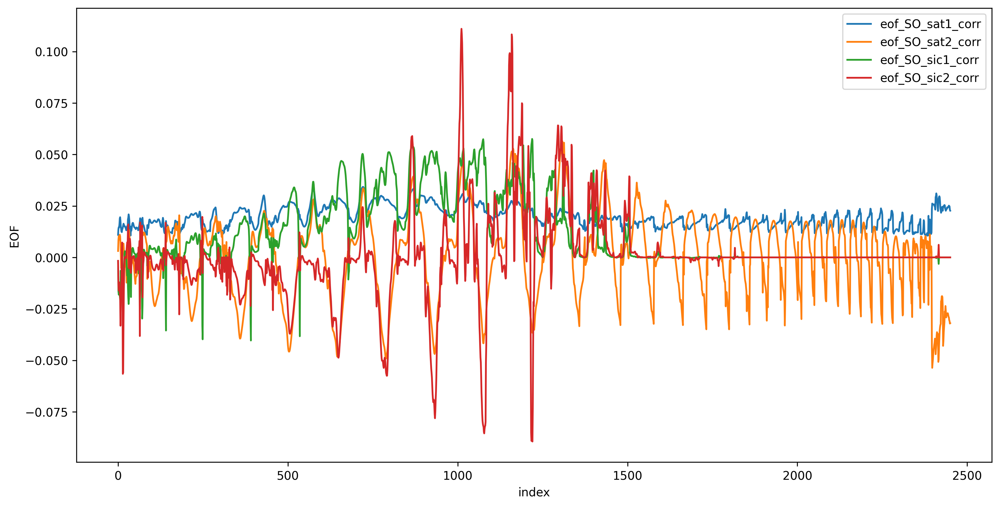

In [75]:
# plot the line plot of four corrected EOFs
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(14, 7), dpi=300)

ax.plot(range(len(eof_SO_sat1_corr)), eof_SO_sat1_corr, label='eof_SO_sat1_corr')
ax.plot(range(len(eof_SO_sat2_corr)), eof_SO_sat2_corr, label='eof_SO_sat2_corr')
ax.plot(range(len(eof_SO_sic1_corr)), eof_SO_sic1_corr, label='eof_SO_sic1_corr')
ax.plot(range(len(eof_SO_sic2_corr)), eof_SO_sic2_corr, label='eof_SO_sic2_corr')

ax.set_xlabel('index')
ax.set_ylabel('EOF')
ax.legend()




In [76]:
eof_SO_sat1_corr.shape

(2451,)

# Calculate AIC and dAIC

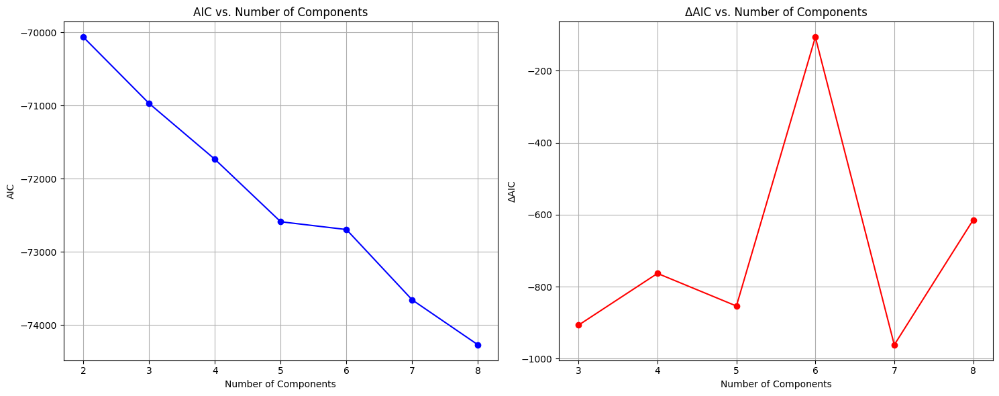

In [88]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import numpy as np

# Stack all four EOFs together
all_eofs = np.vstack([eof_SO_sat1_corr, eof_SO_sat2_corr, eof_SO_sic1_corr, eof_SO_sic2_corr]).T

n_components_range = list(range(2, 9))
aic_values = []

# Calculate AIC for each number of components
for n in n_components_range:
    gmm = GaussianMixture(n_components=n)
    gmm.fit(all_eofs)
    aic_values.append(gmm.aic(all_eofs))

# Calculate ΔAIC
delta_aic = np.diff(aic_values)

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# AIC Plot
ax[0].plot(n_components_range, aic_values, marker='o', color='blue')
ax[0].set_title('AIC vs. Number of Components')
ax[0].set_xlabel('Number of Components')
ax[0].set_ylabel('AIC')
ax[0].grid(True)

# ΔAIC Plot
ax[1].plot(n_components_range[1:], delta_aic, marker='o', linestyle='-', color='red')
ax[1].set_title('ΔAIC vs. Number of Components')
ax[1].set_xlabel('Number of Components')
ax[1].set_ylabel('ΔAIC')
ax[1].grid(True)

plt.tight_layout()
plt.show()


# Doing GMM

In [92]:
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

# Stack all four EOFs together
all_eofs = np.vstack([eof_SO_sat1_corr, eof_SO_sat2_corr, eof_SO_sic1_corr, eof_SO_sic2_corr]).T
print('Shape of all_eofs:', all_eofs.shape)

# Define the GMM model with 
gmm = GaussianMixture(n_components=5)

# Fit the GMM to the EOFs
gmm.fit(all_eofs)

# Predict the cluster each sample belongs to
labels = gmm.predict(all_eofs)



Shape of all_eofs: (2451, 4)


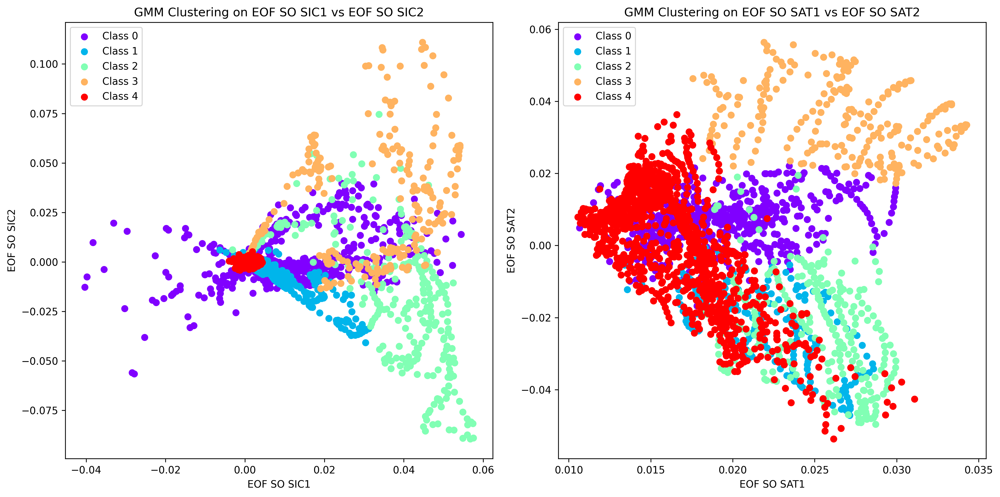

In [93]:
unique_labels = np.unique(labels)
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))

fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=300)

# Scatter plot for eof_SO_sic1_corr and eof_SO_sic2_corr
for label, color in zip(unique_labels, colors):
    indices = labels == label
    axs[0].scatter(eof_SO_sic1_corr[indices], eof_SO_sic2_corr[indices], color=color, label=f'Class {label}')
axs[0].set_title('GMM Clustering on EOF SO SIC1 vs EOF SO SIC2')
axs[0].set_xlabel('EOF SO SIC1')
axs[0].set_ylabel('EOF SO SIC2')
axs[0].legend()

# Scatter plot for eof_SO_sat1_corr and eof_SO_sat2_corr
for label, color in zip(unique_labels, colors):
    indices = labels == label
    axs[1].scatter(eof_SO_sat1_corr[indices], eof_SO_sat2_corr[indices], color=color, label=f'Class {label}')
axs[1].set_title('GMM Clustering on EOF SO SAT1 vs EOF SO SAT2')
axs[1].set_xlabel('EOF SO SAT1')
axs[1].set_ylabel('EOF SO SAT2')
axs[1].legend()

plt.tight_layout()
plt.show()

# Plot the spatial distribution of labels

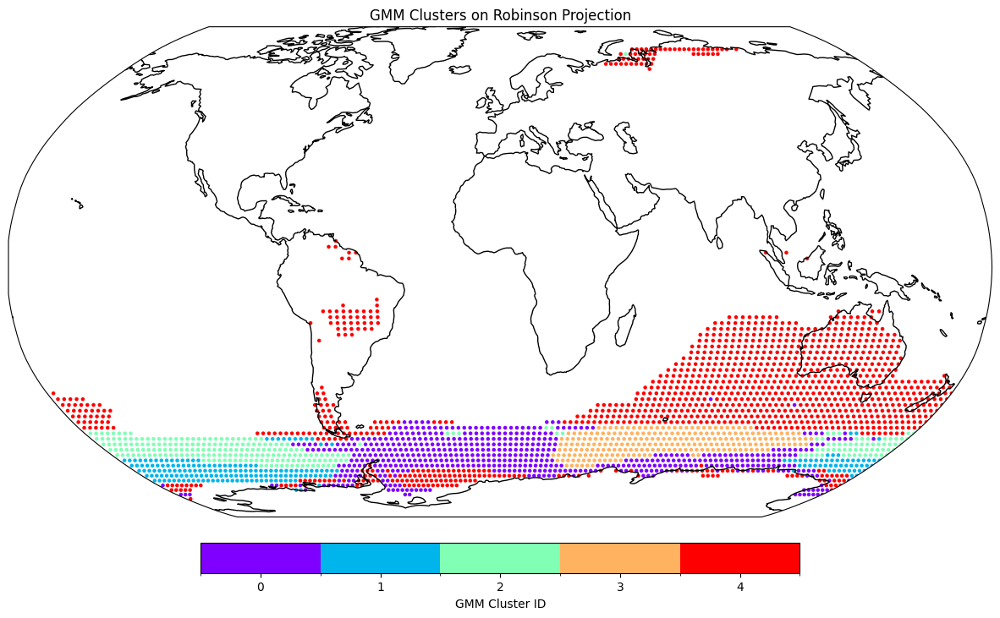

In [94]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import numpy as np
from matplotlib.colors import BoundaryNorm, ListedColormap


# Extract latitudes and longitudes from lat_lon_pairs
lats = lat_lon_pairs[:, 0]
lons = lat_lon_pairs[:, 1]

# Create a new figure and set up the map with Robinson projection
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())

# Add coastlines
ax.add_feature(cfeature.COASTLINE)

unique_labels = np.unique(labels)
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
colormap = ListedColormap(colors)
norm = BoundaryNorm(np.arange(-0.5, len(unique_labels) + 0.5), colormap.N)

# Plot latitude-longitude pairs colored by GMM labels
sc = ax.scatter(lons, lats, c=labels, s=5, cmap=colormap, norm=norm, transform=ccrs.PlateCarree())

# Add a colorbar with discrete colors
cbar_ticks = np.arange(len(unique_labels))
cbar = plt.colorbar(sc, ticks=cbar_ticks, orientation='horizontal', fraction=0.046, pad=0.04, ax=ax)
cbar.set_label('GMM Cluster ID')

# Display the plot
plt.title("GMM Clusters on Robinson Projection")
plt.show()

# Still GMM, but using Monte Carlo

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture

def cal_AIC_mc(eofs, n_components_range=range(2, 9), n_iterations=10, plotfigure=True):
    """
    Calculate and plot AIC values for GMM with a range of components.

    Parameters:
    - eofs: ndarray containing EOF data with shape (N, 4).
    - n_components_range: range of GMM components to evaluate.
    - n_iterations: number of Monte Carlo iterations for each number of components.

    Returns:
    - AIC values dictionary.
    """
    
    if not isinstance(eofs, np.ndarray) or eofs.shape[1] != 4:
        raise ValueError("eofs should be an ndarray with shape (N, 4)")
    
    aic_values_dict = {}

    # Loop over the range of components
    for n_components in n_components_range:
        aic_values = []
        
        # Monte Carlo iterations
        for _ in range(n_iterations):
            gmm = GaussianMixture(n_components=n_components)
            gmm.fit(eofs)
            
            # Calculate and store the AIC for this fit
            aic_values.append(gmm.aic(eofs))
        
        # Record the AIC values for this number of components
        aic_values_dict[n_components] = aic_values

    # Compute means, lower and upper limits
    means = [np.mean(aic_values_dict[key]) for key in n_components_range]
    lower_limits = [np.percentile(aic_values_dict[key], 5) for key in n_components_range]
    upper_limits = [np.percentile(aic_values_dict[key], 95) for key in n_components_range]
    lower_errors = [mean - lower for mean, lower in zip(means, lower_limits)]
    upper_errors = [upper - mean for mean, upper in zip(means, upper_limits)]
    
    # Compute ΔAIC
    delta_aics_all_iterations = np.diff(np.array([[aic_values_dict[n][i] for n in n_components_range] 
                                                  for i in range(n_iterations)]), axis=1)
    delta_aics_means = np.mean(delta_aics_all_iterations, axis=0)
    delta_aics_lowers = np.percentile(delta_aics_all_iterations, 5, axis=0)
    delta_aics_uppers = np.percentile(delta_aics_all_iterations, 95, axis=0)
    delta_lower_errors = delta_aics_means - delta_aics_lowers
    delta_upper_errors = delta_aics_uppers - delta_aics_means
    
    # Plotting
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))

    # AIC Plot
    ax[0].errorbar(n_components_range, means, yerr=[lower_errors, upper_errors], 
                   capsize=5, fmt='-o', label='Mean AIC with 5% and 95% quantiles of AIC')
    ax[0].set_xlabel('Number of Classes')
    ax[0].set_ylabel('AIC')
    ax[0].legend()
    ax[0].grid(True)

    # ΔAIC Plot
    ax[1].errorbar(n_components_range[1:], delta_aics_means, yerr=[delta_lower_errors, delta_upper_errors], 
                   capsize=5, fmt='-o', color='red', label='Mean ΔAIC with 5% and 95% quantiles of ΔAIC')
    ax[1].axhline(0, color='grey', linestyle='--')
    ax[1].set_xlabel('Number of Classes')
    ax[1].set_ylabel('ΔAIC')
    ax[1].legend()
    ax[1].grid(True)

    plt.tight_layout()
    plt.show()

    return aic_values_dict


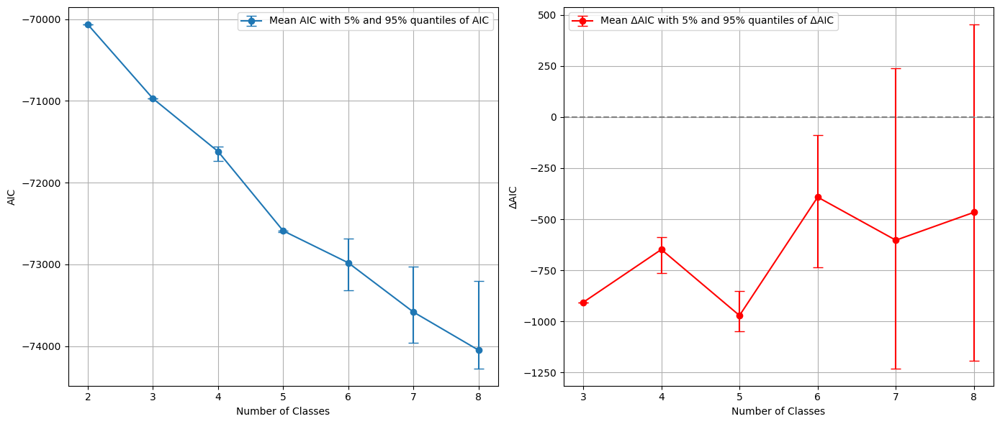

In [83]:
all_eofs = np.vstack([eof_SO_sat1_corr, eof_SO_sat2_corr, eof_SO_sic1_corr, eof_SO_sic2_corr]).T
sic_gmm_aic = cal_AIC_mc(all_eofs, n_iterations=100)


In [53]:
import numpy as np
from sklearn.mixture import GaussianMixture

def gmm_mc_sklearn_ndarray(eofs, n_components=5, n_iterations=10, covariance_type='full'):
    """
    Perform Gaussian Mixture Modeling on the given EOF data.

    Parameters:
    - eofs: ndarray of shape (n_samples, n_features). Typically for the current use case, n_features would be 4.
    - n_components: number of Gaussian components for GMM. Default is 5.
    - n_iterations: number of iterations for the Monte Carlo method. Default is 10.
    - covariance_type: type of covariance parameters to use. Default is 'full'.

    Returns:
    - results: a list containing the label assignments for each iteration.
    """

    # Shape check for the eofs ndarray
    if len(eofs.shape) != 2:
        raise ValueError("eofs should be a 2D ndarray.")
    
    results = []

    # For each iteration, fit a GMM
    for _ in range(n_iterations):
        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type)
        gmm.fit(eofs)
        labels = gmm.predict(eofs)
        
        # Store results for each iteration
        results.append({
            'labels': labels,
        })
    
    return results


In [54]:
all_eofs = np.vstack([eof_SO_sat1_corr, eof_SO_sat2_corr, eof_SO_sic1_corr, eof_SO_sic2_corr]).T
labels=gmm_mc_sklearn_ndarray(all_eofs, n_components=5, n_iterations=100, covariance_type='full')

# Evaluate the consistency of GMM MC results

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

def plot_mc_labels(labels, colormap='Accent'):
    """
    Plot the labels from GMM over MC Iterations.

    Parameters:
    - labels: List of dictionaries, each with a 'labels' key that has a numpy array of labels.
    - colormap: A string representing the colormap. Default is 'tab10'.
    """

    # Convert the labels to a 2D numpy array
    labels_array = np.array([result['labels'] for result in labels])

    n_iterations, n_samples = labels_array.shape

    # Define custom colormap and norm
    unique_labels = np.unique(labels_array)
    cmap = plt.get_cmap(colormap, len(unique_labels))
    bounds = np.arange(len(unique_labels) + 1) - 0.5
    norm = colors.BoundaryNorm(bounds, cmap.N)

    # Create the plot
    plt.figure(figsize=(15, 8), dpi=300)
    plt.imshow(labels_array, aspect='auto', cmap=cmap, norm=norm)

    # Setting colorbar
    cbar = plt.colorbar(ticks=np.arange(len(unique_labels)))
    cbar.set_label('Class label', rotation=270, labelpad=15)

    plt.xlabel('Sample Index')
    plt.ylabel('Iteration')
    plt.title('Labels from GMM over MC Iterations')
    plt.tight_layout()
    plt.show()



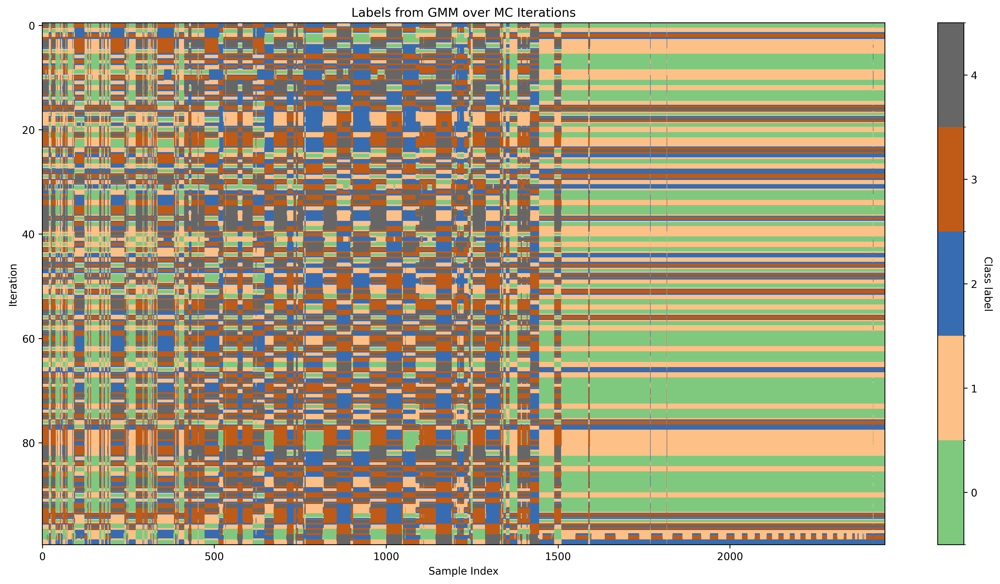

In [60]:
plot_mc_labels(labels)

# Align labels, the result from the first iteration is take as the reference, and all other iteration's result is aligned to the first iteration according to their overlaps of the index

In [61]:
import numpy as np

def align_labels4two_iters(reference_labels, labels_to_align):
    unique_ref_labels = np.unique(reference_labels)
    unique_align_labels = np.unique(labels_to_align)
    
    n_classes_ref = len(unique_ref_labels)
    n_classes_align = len(unique_align_labels)

    # Ensure the number of unique classes is the same in both label sets
    if n_classes_ref != n_classes_align:
        raise ValueError("The number of unique classes in the reference and labels to align must be the same.")

    n_classes = n_classes_ref

    # Create a mapping based on overlap
    mapping = {}
    for ref_label in unique_ref_labels:
        overlaps = [] # for each ref_label, calculate the sum of overlap with each align_label
        for align_label in unique_align_labels:
            overlap = np.sum((labels_to_align == align_label) & (reference_labels == ref_label))
            overlaps.append(overlap)

        # Get the align label with the max overlap for the current reference label
        max_overlap_label = unique_align_labels[np.argmax(overlaps)]
        
        if max_overlap_label in mapping.values():
            # Handle the situation where a label has already been mapped due to identical overlaps
            # For example, for two ref_labels, they corresponds to the same align_label
            available_labels = list(set(unique_align_labels) - set(mapping.values())) # find the labels in unique_align_labels that have not been mapped
            overlaps_available = [overlaps[i] for i in range(n_classes) if unique_align_labels[i] in available_labels]
            max_overlap_label = available_labels[np.argmax(overlaps_available)]

        mapping[ref_label] = max_overlap_label

    # Apply the mapping to the labels_to_align array
    aligned_labels = np.copy(labels_to_align)
    for ref, align in mapping.items():
        aligned_labels[labels_to_align == align] = ref

    return aligned_labels


def align_labels(results):
    n_iterations=len(results)
    reference_labels = results[0]['labels']
    for i in range(1, n_iterations):
        aligned_labels = align_labels4two_iters(reference_labels, results[i]['labels'])
        results[i]['labels'] = aligned_labels
    return results


In [62]:
labels=align_labels(labels)

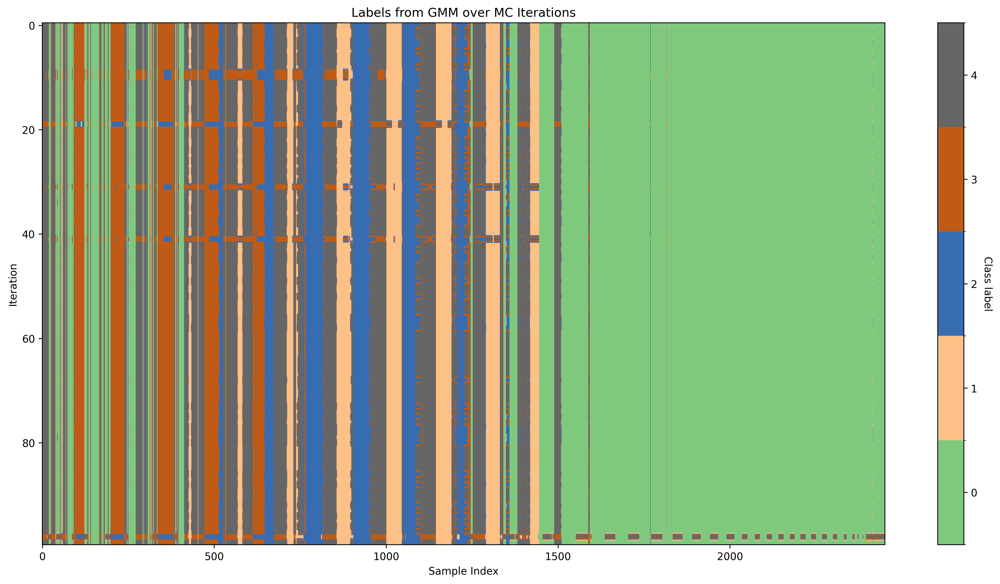

In [63]:
plot_mc_labels(labels)

In [64]:
def measure_consistency(labels,threshold_of_consistency=0.05):
    """
    Measure the consistency of label assignments compared to the first iteration.

    Parameters:
    - labels: List of dictionaries, each containing a 'labels' key with numpy array of labels.

    Returns:
    - consistency_ratio: Proportion of iterations where labels are consistent with the first iteration.
    """

    reference_labels = labels[0]['labels']
    n_samples = len(reference_labels)
    threshold = threshold_of_consistency * n_samples  # 5% of the total samples
    
    consistent_iterations = 0

    for result in labels:
        # Compute the number of differing labels compared to the reference
        diff_labels_count = np.sum(result['labels'] != reference_labels)
        
        if diff_labels_count <= threshold:
            consistent_iterations += 1

    consistency_ratio = consistent_iterations / len(labels)
    
    return consistency_ratio




In [65]:
consistency_ratio = measure_consistency(labels, threshold_of_consistency=0.05)
print(f"Proportion of iterations where labels are consistent with the first iteration: {consistency_ratio:.2f}")

Proportion of iterations where labels are consistent with the first iteration: 0.94


# Plot the GMM labels of the first iteration on the scatter plot of EOFs

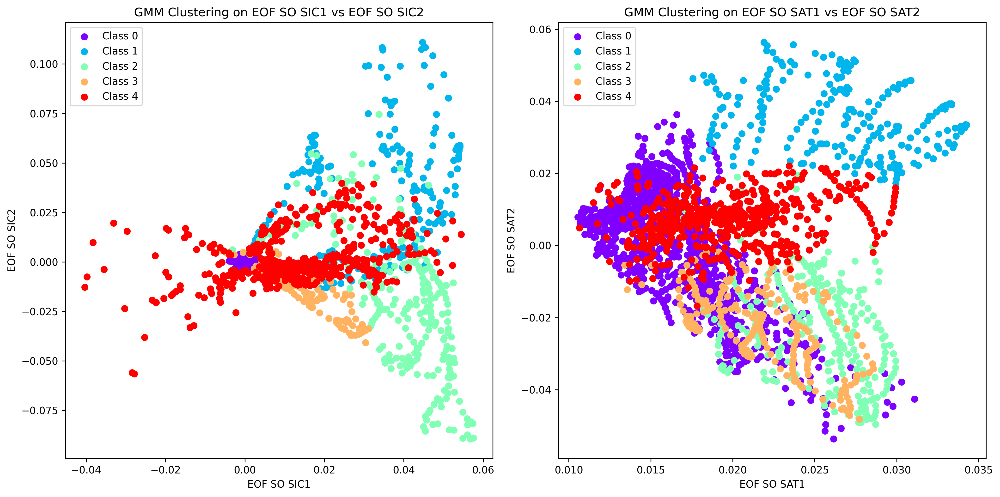

In [67]:
labels2plot=labels[0]['labels']


unique_labels = np.unique(labels2plot)
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))

fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=300)

# Scatter plot for eof_SO_sic1_corr and eof_SO_sic2_corr
for label, color in zip(unique_labels, colors):
    indices = labels2plot == label
    axs[0].scatter(eof_SO_sic1_corr[indices], eof_SO_sic2_corr[indices], color=color, label=f'Class {label}')
axs[0].set_title('GMM Clustering on EOF SO SIC1 vs EOF SO SIC2')
axs[0].set_xlabel('EOF SO SIC1')
axs[0].set_ylabel('EOF SO SIC2')
axs[0].legend()

# Scatter plot for eof_SO_sat1_corr and eof_SO_sat2_corr
for label, color in zip(unique_labels, colors):
    indices = labels2plot == label
    axs[1].scatter(eof_SO_sat1_corr[indices], eof_SO_sat2_corr[indices], color=color, label=f'Class {label}')
axs[1].set_title('GMM Clustering on EOF SO SAT1 vs EOF SO SAT2')
axs[1].set_xlabel('EOF SO SAT1')
axs[1].set_ylabel('EOF SO SAT2')
axs[1].legend()

plt.tight_layout()
plt.show()

# Plot the spatial distribution of labels of the first iteration

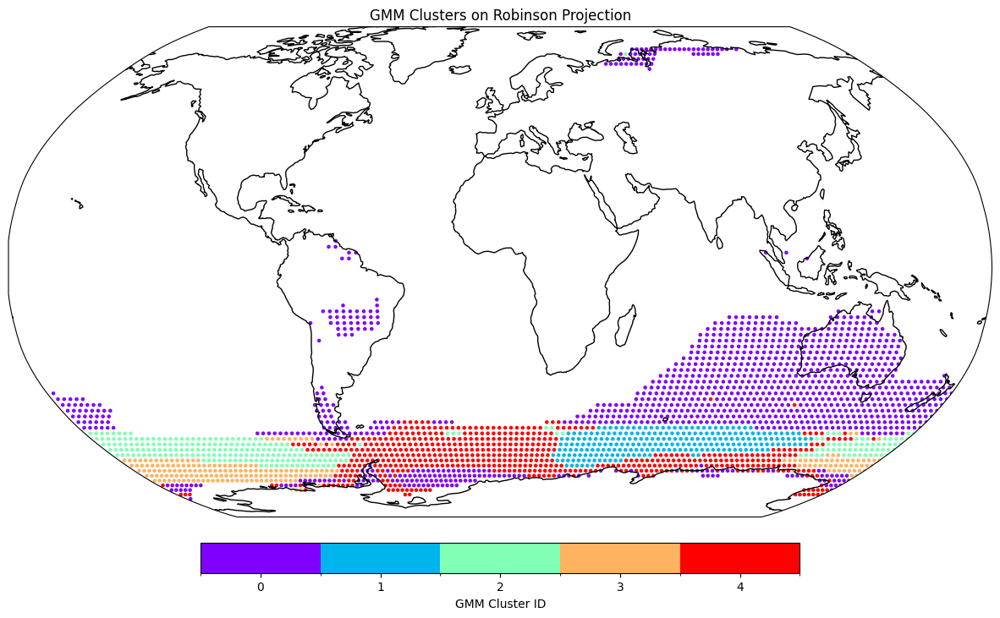

In [66]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import numpy as np
from matplotlib.colors import BoundaryNorm, ListedColormap

labels2plot=labels[0]['labels']

# Extract latitudes and longitudes from lat_lon_pairs
lats = lat_lon_pairs[:, 0]
lons = lat_lon_pairs[:, 1]

# Create a new figure and set up the map with Robinson projection
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())

# Add coastlines
ax.add_feature(cfeature.COASTLINE)

unique_labels = np.unique(labels2plot)
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
colormap = ListedColormap(colors)
norm = BoundaryNorm(np.arange(-0.5, len(unique_labels) + 0.5), colormap.N)

# Plot latitude-longitude pairs colored by GMM labels
sc = ax.scatter(lons, lats, c=labels2plot, s=5, cmap=colormap, norm=norm, transform=ccrs.PlateCarree())

# Add a colorbar with discrete colors
cbar_ticks = np.arange(len(unique_labels))
cbar = plt.colorbar(sc, ticks=cbar_ticks, orientation='horizontal', fraction=0.046, pad=0.04, ax=ax)
cbar.set_label('GMM Cluster ID')

# Display the plot
plt.title("GMM Clusters on Robinson Projection")
plt.show()

# Still confusing with the shape of PC2s, some more analysis

# Doing PCA on SAT and seaice data, respectively

In [75]:
from sklearn.decomposition import PCA


# For sic_SO_data
pca_sic = PCA(n_components=3)
sic_pcs = pca_sic.fit_transform(sic_SO_data.T)

sic_eof1 = pca_sic.components_[0]
sic_eof2 = pca_sic.components_[1]

explained_variance = pca_sic.explained_variance_ratio_

print("Variance explained by sic EOF1 (PC1):", explained_variance[0] * 100, "%")
print("Variance explained by sic EOF2 (PC2):", explained_variance[1] * 100, "%")
print("Variance explained by sic EOF3 (PC3):", explained_variance[2] * 100, "%")

# For sat_SO_data
pca_sat = PCA(n_components=3)
sat_pcs = pca_sat.fit_transform(sat_SO_data.T)

sat_eof1 = pca_sat.components_[0]
sat_eof2 = pca_sat.components_[1]

explained_variance = pca_sat.explained_variance_ratio_

print()
print("Variance explained by sat EOF1 (PC1):", explained_variance[0] * 100, "%")
print("Variance explained by sat EOF2 (PC2):", explained_variance[1] * 100, "%")
print("Variance explained by sat EOF3 (PC3):", explained_variance[2] * 100, "%")

Variance explained by sic EOF1 (PC1): 89.48839902877808 %
Variance explained by sic EOF2 (PC2): 5.04167415201664 %
Variance explained by sic EOF3 (PC3): 2.6851648464798927 %

Variance explained by sat EOF1 (PC1): 97.63101935386658 %
Variance explained by sat EOF2 (PC2): 1.5352189540863037 %
Variance explained by sat EOF3 (PC3): 0.35943847615271807 %


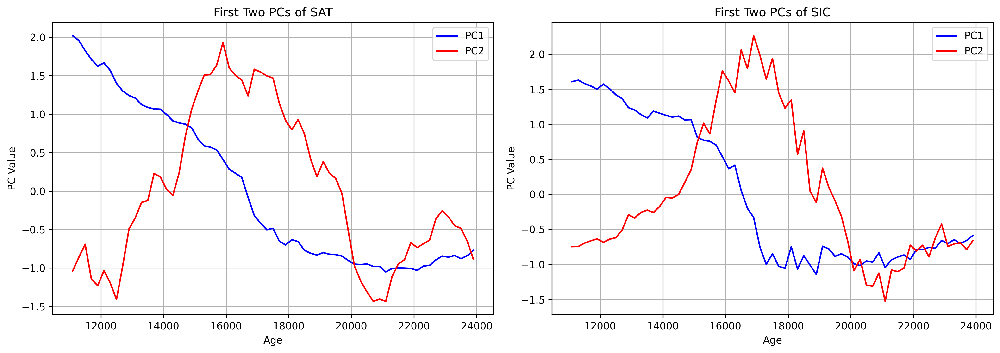

In [76]:
import matplotlib.pyplot as plt
from scipy.stats import zscore


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 5),dpi=300)

# Plot for sat_SO_data
# ax[0].plot(ds_sat_EOFs['age'].values, sat_pcs[:, 0], label='PC1', color='blue')
# ax[0].plot(ds_sat_EOFs['age'].values, sat_pcs[:, 1], label='PC2', color='red')
ax[0].plot(ds_sat_EOFs['age'].values, zscore(sat_pcs[:, 0]), label='PC1', color='blue')
ax[0].plot(ds_sat_EOFs['age'].values, zscore(sat_pcs[:, 1]), label='PC2', color='red')
ax[0].set_title('First Two PCs of SAT')
ax[0].set_xlabel('Age')
ax[0].set_ylabel('PC Value')
ax[0].legend()
ax[0].grid(True)

# Plot for sic_SO_data
# ax[1].plot(ds_sat_EOFs['age'].values, sic_pcs[:, 0], label='PC1', color='blue')
# ax[1].plot(ds_sat_EOFs['age'].values, sic_pcs[:, 1], label='PC2', color='red')
ax[1].plot(ds_sat_EOFs['age'].values, zscore(sic_pcs[:, 0]), label='PC1', color='blue')
ax[1].plot(ds_sat_EOFs['age'].values, zscore(sic_pcs[:, 1]), label='PC2', color='red')
ax[1].set_title('First Two PCs of SIC')
ax[1].set_xlabel('Age')
ax[1].set_ylabel('PC Value')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()


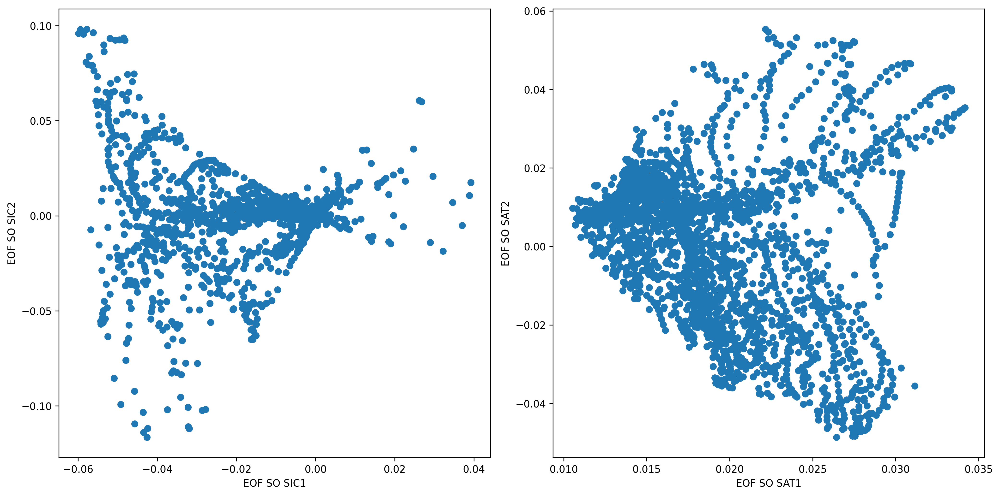

In [81]:


fig, axs = plt.subplots(1, 2, figsize=(14, 7), dpi=300)


axs[0].scatter(sic_eof1, sic_eof2)
axs[0].set_xlabel('EOF SO SIC1')
axs[0].set_ylabel('EOF SO SIC2')


axs[1].scatter(sat_eof1, sat_eof2)
axs[1].set_xlabel('EOF SO SAT1')
axs[1].set_ylabel('EOF SO SAT2')


plt.tight_layout()
plt.show()
